In [3]:
import matplotlib.pyplot as plt
import networkx as nx
import pandas as pd
import pickle 

In [27]:
#Funciones Auxiliares

colormap = plt.cm.tab20
def str_color(r, g, b, a):
    '''
    Convierte un color RGBA en formato decimal (0-1) a un código hexadecimal de color.
    - Toma los valores de rojo (r), verde (g), azul (b) y alfa (a) como entrada.
    - Convierte cada componente a un entero entre 0 y 255.
    - Retorna una cadena en formato hexadecimal, útil para colorear nodos en visualizaciones.
    '''
    return "#" + format(int(r*255), f'0{2}x') + format(int(g*255), f'0{2}x') + format(int(b*255), f'0{2}x') + format(int(a*255), f'0{2}x')

def assign_colors(values):
    '''
    Asigna colores a una lista de valores numéricos.
    - Usa un mapa de colores (colormap) para convertir cada valor en un color RGBA.
    - Convierte los colores RGBA a formato hexadecimal utilizando `str_color`.
    - Retorna una lista de colores en formato hexadecimal, que se puede usar para colorear nodos.
    '''
    colors = [str_color(*colormap(v)) for v in values]
    return colors

## Características de la red social 

En la red que se facilita (hashtags_cleaned.graphml), los nodos son hashtags de un dataset recogido usando la técnica snowball, a partir del hashtag elections2020, durante las Elecciones de USA de 2020 en múltiples idiomas; una arista une dos nodos si ambos hashtags aparecieron en el mismo mensaje, y el peso (“weight”) indica el N de tweets en los que aparecieron a la vez. 

Para realizar la prác ca, se proponen una serie de ejercicios para obtener una buena representación de la red y la información que con ene

# Cargar Datos

In [7]:
G = nx.read_graphml('hashtags_cleaned/hashtags_cleaned.graphml')
#nx.draw(G)
#plt.show()


# 1. Calcula las comunidades, utilizándoselo el algoritmo de Leiden. ¿Cuantas comunidades salen? 

In [64]:
from cdlib.algorithms import leiden
from collections import defaultdict
from collections import Counter


# Realizar la detección de comunidades
leiden_coms = leiden(G).to_node_community_map()

#diccionario nodo, lista de comunidades a las que pertenece el nodo 
leiden_coms
#diccionario nodo, y comunidad (1 valor)
coms = {k: v[0] for k, v in leiden_coms.items()}
coms

#Número de comunidades
num_comunidades = len(set(coms.values()))
print(f'Comunidades detectadas: {num_comunidades}')

comunidades = defaultdict(list)
for node, community in coms.items():
    comunidades[community].append(node)
#comunidades


Comunidades detectadas: 50


# 2. El tamaño del grafo excede el tiempo que tenemos en la práctca, por ello, y para tener una representación más compacta, colapsa el grafo de forma que cada nodo sea una comunidad, manteniéndoosla los atributos. 

In [21]:
#new_graph graph es un grafo en el que cada nodo es una comunidad
new_graph= nx.Graph()

#ahora quiero diccionario comunidad y valores lista de nodos 
comunidades = defaultdict(list)
for node, community in coms.items():
    comunidades[community].append(node)
#comunidades

#añadir nodos a mi grafo (comunidades)
for community in comunidades.keys():
    new_graph.add_node(community)

#añadir aristas, que sigan conectadas los nodos entre sí aunque ahora estén en comunidad
#se unen todos los nodos (comunidades), aunque tengamos muchas aristas
#otra opcion es que sea grafo ponderado
def calculate_edge_weight(nodes_1, nodes_2):
    weight = 0
    for node_1 in nodes_1:
        for node_2 in nodes_2:
            if G.has_edge(node_1, node_2):
                weight += int(G.edges[node_1, node_2]["weight"])
    return weight  

for community_1, nodes_1 in comunidades.items():
    for community_2, nodes_2 in comunidades.items():
        if community_1 != community_2:
            # Calcular el peso de la arista entre las dos comunidades
            weight = calculate_edge_weight(nodes_1, nodes_2)
            if weight > 0:  
                new_graph.add_edge(community_1, community_2, weight=weight)


## Guardar y Leer Grafo


In [65]:

new_graph_path = './new_graph.graphml'
#nx.write_graphml(new_graph, new_graph_path)
new_graph = nx.read_graphml(new_graph_path)


## Visualización

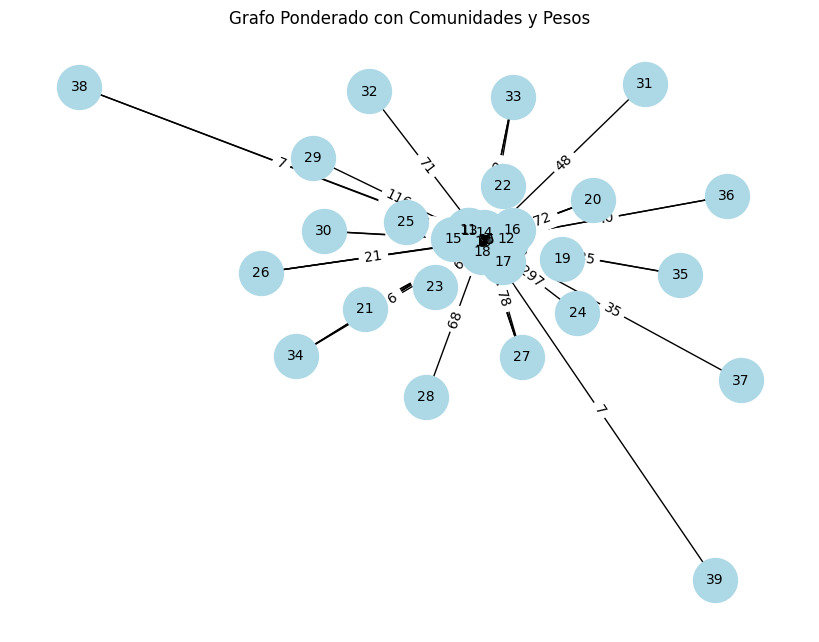

In [66]:
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(new_graph)  
nx.draw(new_graph, pos, with_labels=True, node_size=1000, node_color='lightblue', font_size=10)
edge_labels = nx.get_edge_attributes(new_graph, 'weight')
nx.draw_networkx_edge_labels(new_graph, pos, edge_labels=edge_labels)

# Titulo
plt.title("Grafo Ponderado con Comunidades y Pesos")
plt.show()

# 3. Aplica distintas métricas que puedan resultar útiles para tener una mejor idea de las comunidades, y crea visualizaciones diferentes en función de las métricas. 

In [30]:
# Calcular métricas notebook centrality (micro)
degree_centrality = nx.degree_centrality(new_graph)
betweenness_centrality = nx.betweenness_centrality(new_graph)
closeness_centrality = nx.closeness_centrality(new_graph)
eigenvector_centrality = nx.eigenvector_centrality(new_graph)
clustering_coefficient = nx.clustering(new_graph)
avg_shortest_path_length = nx.average_shortest_path_length(new_graph)

#métricas
metrics_dict = {
    "Degree Centrality": degree_centrality,
    "Betweenness Centrality": betweenness_centrality,
    "Closeness Centrality": closeness_centrality,
    "Eigenvector Centrality": eigenvector_centrality,
    "Clustering Coefficient": clustering_coefficient,
    "Average Shortest Path Length": avg_shortest_path_length
}

df = pd.DataFrame(metrics_dict)

df

,Degree Centrality,Betweenness Centrality,Closeness Centrality,Eigenvector Centrality,Clustering Coefficient,Average Shortest Path Length
0,0.666667,0.076628,0.750000,0.259467,0.492308,1.789744
1,0.589744,0.063503,0.709091,0.244487,0.573123,1.789744
2,0.743590,0.228855,0.795918,0.260372,0.389163,1.789744
3,0.564103,0.025526,0.696429,0.246982,0.645022,1.789744
4,0.871795,0.345409,0.886364,0.272891,0.299465,1.789744
5,0.589744,0.045589,0.709091,0.251001,0.604743,1.789744
6,0.487179,0.006553,0.661017,0.234709,0.801170,1.789744
7,0.564103,0.022198,0.696429,0.249396,0.658009,1.789744
8,0.461538,0.004783,0.650000,0.227500,0.843137,1.789744
9,0.512821,0.007533,0.672414,0.242052,0.763158,1.789744


## Visualizar degree, closeness, eigenvector y coeficiente de clustering para 

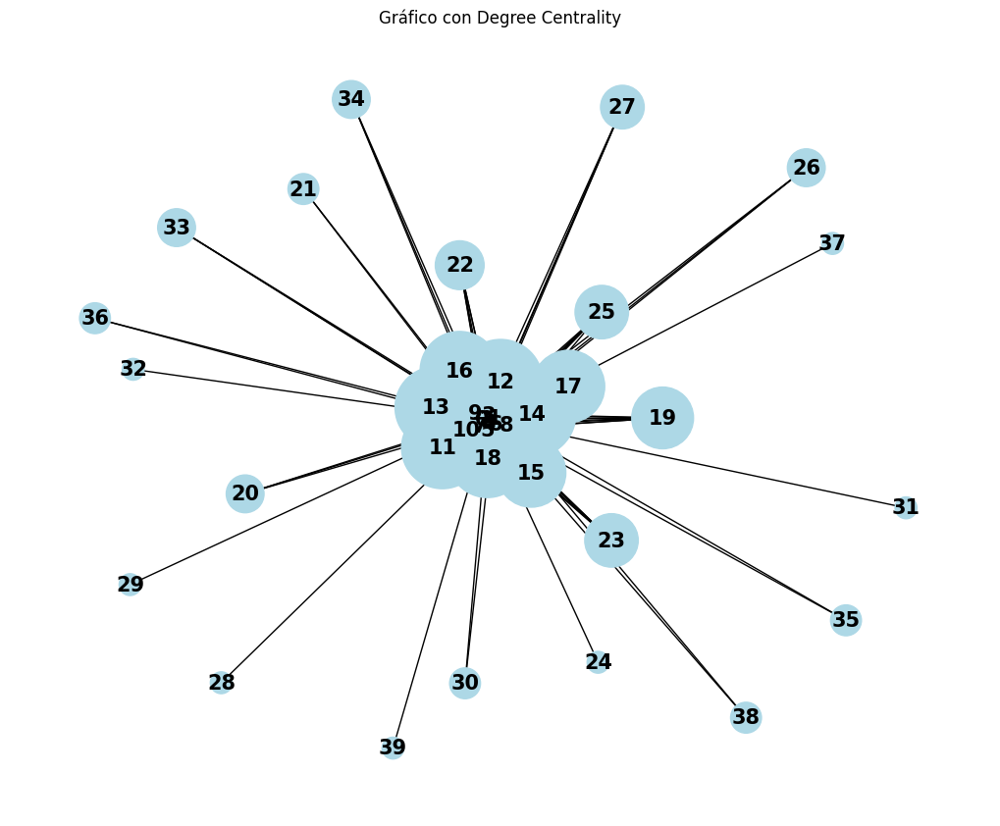

In [82]:
#Centrality Degree

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(new_graph, seed=42, k=5)

# Usar Degree Centrality para el tamaño de los nodos
node_size = [v * 10000 for v in degree_centrality.values()]
nx.draw(new_graph, pos, with_labels=True, node_size=node_size, node_color='lightblue', font_size=15, font_weight='bold')
plt.title("Gráfico con Degree Centrality")
plt.show()


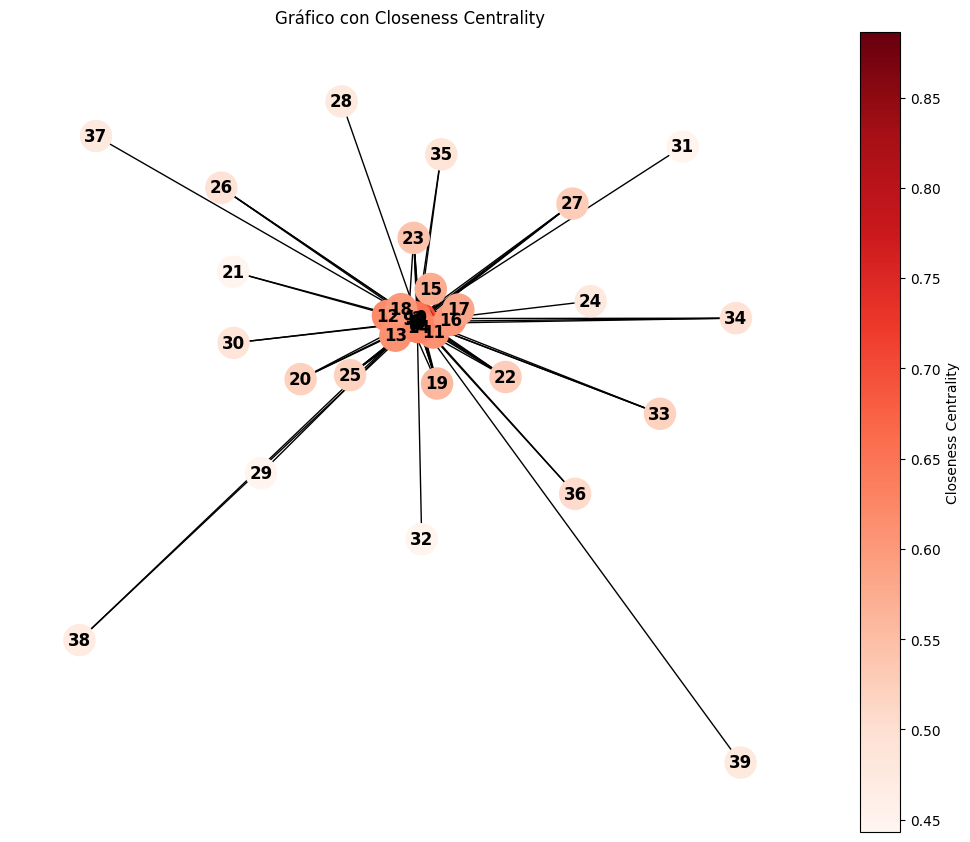

In [83]:
pos = nx.spring_layout(new_graph)

# Usar Closeness Centrality para el color de los nodos
node_color = [closeness_centrality[node] for node in new_graph.nodes()]
plt.figure(figsize=(10, 8))
node_sizes = [500 for _ in new_graph.nodes()]  # Tamaño de los nodos
nx.draw(new_graph, pos, with_labels=True, node_size=node_sizes, node_color=node_color, 
        cmap=plt.cm.Reds, font_size=12, font_weight='bold')

sm = plt.cm.ScalarMappable(cmap=plt.cm.Reds, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm.set_array([])  
plt.colorbar(sm, label='Closeness Centrality')

plt.title("Gráfico con Closeness Centrality")
plt.show()


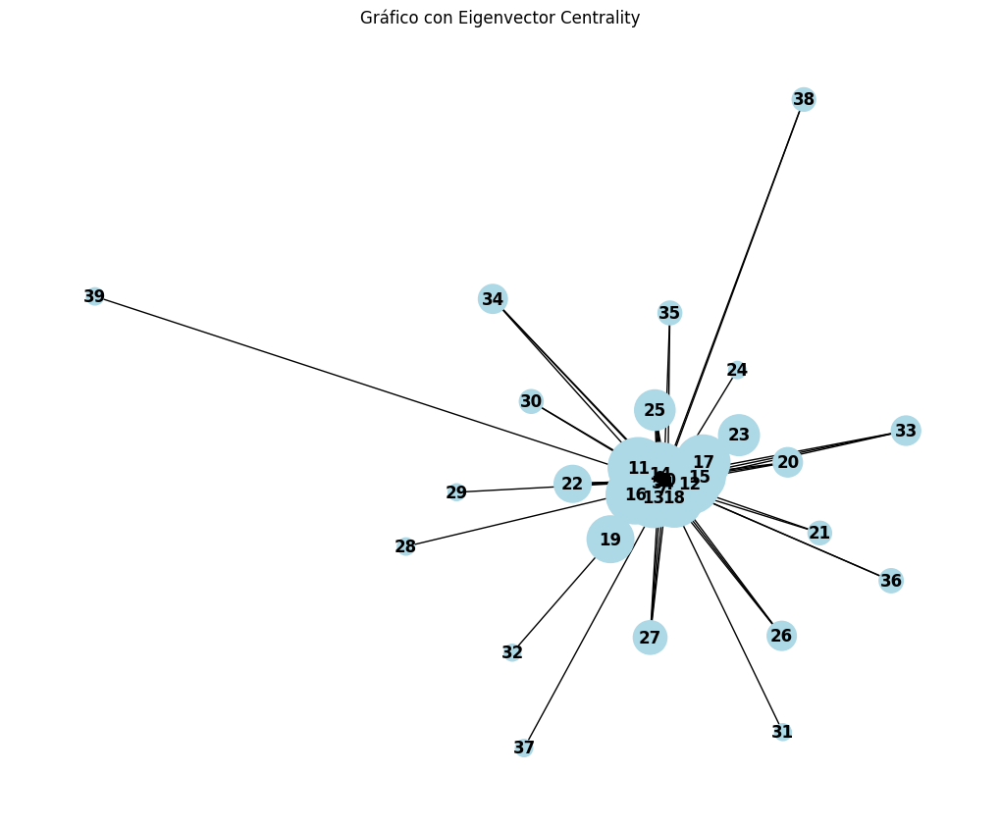

In [84]:
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(new_graph)

# Usar Eigenvector Centrality para el tamaño de los nodos
node_size = [v * 10000 for v in eigenvector_centrality.values()]
nx.draw(new_graph, pos, with_labels=True, node_size=node_size, node_color='lightblue', font_size=12, font_weight='bold')
plt.title("Gráfico con Eigenvector Centrality")
plt.show()


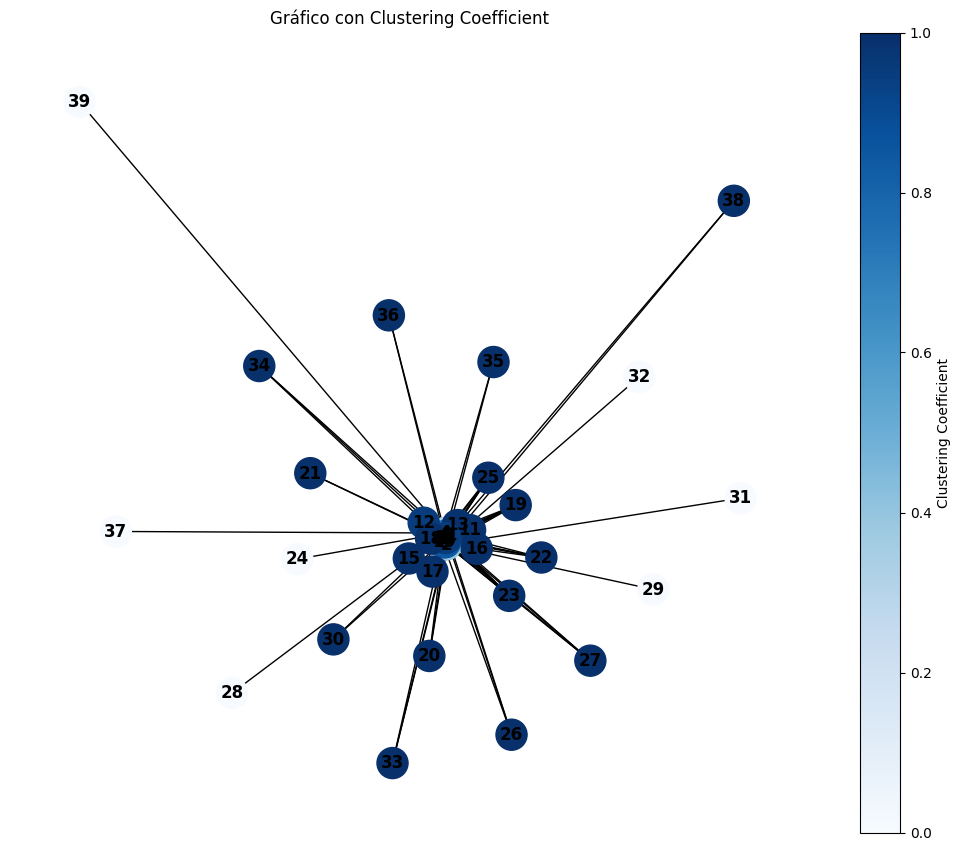

In [85]:
import matplotlib.pyplot as plt
import networkx as nx


pos = nx.spring_layout(new_graph)

# Usar Clustering Coefficient para el color de los nodos
node_color = [clustering_coefficient.get(node, 0) for node in new_graph.nodes()]
plt.figure(figsize=(10, 8))
node_sizes = [500 for _ in new_graph.nodes()]  
nx.draw(new_graph, pos, with_labels=True, node_size=node_sizes, node_color=node_color, 
        cmap=plt.cm.Blues, font_size=12, font_weight='bold')

sm = plt.cm.ScalarMappable(cmap=plt.cm.Blues, norm=plt.Normalize(vmin=min(node_color), vmax=max(node_color)))
sm.set_array([])
plt.colorbar(sm, label='Clustering Coefficient')

plt.title("Gráfico con Clustering Coefficient")
plt.show()

# 4. ¿Hay nodos centrales?, ¿qué métricas nos ayudan a saberlo? ¿Qué métricas macro nos servirían para explicar la estructura de la red, teniendo en cuenta que son comunidades y no nodos? 

In [86]:
#El centro de un grafo son los nodos cuya Eccentricity es igual al radio
#Métrica eccentricity, centralidad por cercanía entre mi nodo central y el resto
#Es necesario saber el radio y diámetro de la red

#Densidad
N=40
print(f"El grafo tiene {new_graph.number_of_nodes()} nodos y {new_graph.number_of_edges()} aristas.")
total = (N*(N-1))/2
M = new_graph.number_of_edges()
print(f'Densidad {M/total}')

#Radio y Diámetro 
diameter = nx.diameter(new_graph)
radius = nx.radius(new_graph)

print(f"Radio: {radius}")
print(f"Diametro: {diameter}")

#Eccentricity
eccentricity= nx.eccentricity(new_graph)
print(f"Eccentricity: {eccentricity}")



El grafo tiene 40 nodos y 209 aristas.
Densidad 0.26794871794871794
Radio: 2
Diametro: 3
Eccentricity: {'0': 2, '1': 2, '2': 2, '3': 2, '4': 2, '5': 2, '6': 2, '7': 2, '8': 2, '9': 2, '10': 2, '11': 2, '12': 2, '13': 2, '14': 2, '15': 2, '16': 2, '17': 2, '18': 2, '19': 2, '20': 2, '21': 3, '22': 3, '23': 2, '24': 3, '25': 3, '26': 3, '27': 2, '28': 3, '29': 3, '30': 3, '31': 3, '32': 3, '33': 2, '34': 3, '35': 3, '36': 3, '37': 3, '38': 3, '39': 3}


Los nodos centrales son aquellos con eccentricidad menor (2), ya que están más cercanos a otros nodos. En este caso, las comunidades 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 23, y 33 son los nodos más centrales de la red.

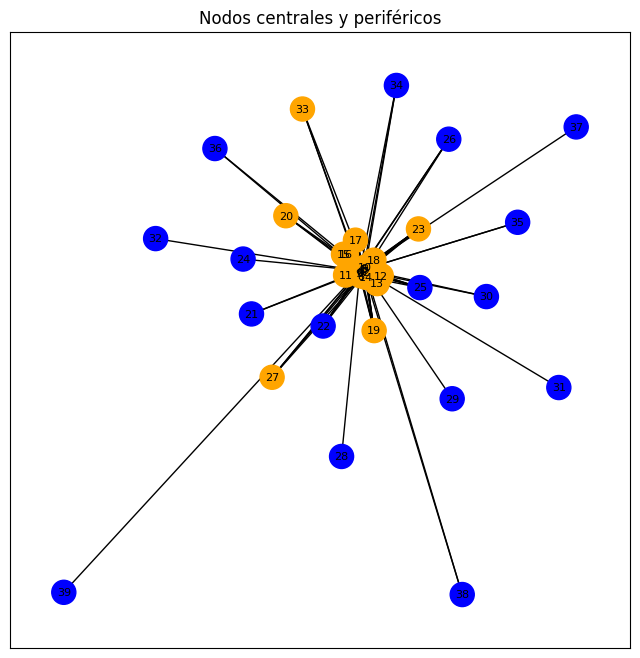

In [87]:
center = nx.center(new_graph)
periphery = nx.periphery(new_graph)

# Asignar colores: naranja para centro, azul para periferia, gris para otros
colors_centralidad = [
    "orange" if n in center else "blue" if n in periphery else "gray" for n in new_graph.nodes
]

# Dibujar el grafo con colores por centralidad
plt.figure(figsize=(8, 8))

pos = nx.spring_layout(new_graph, seed=42) 

# Dibujar el grafo con colores por centralidad (naranja para centro, azul para periferia)
nx.draw_networkx(
    new_graph,
    pos,
    node_color=colors_centralidad,
    node_size=300,
    with_labels=True,
    labels={node: node for node in new_graph.nodes},
    font_size=8)

plt.title("Nodos centrales y periféricos")
plt.show()

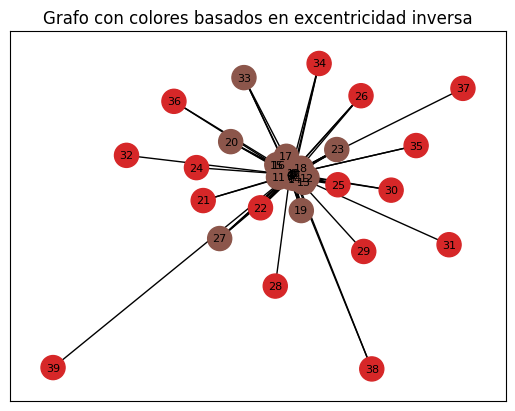

In [88]:
eccentricity_values = {node: 1 / ecc for node, ecc in nx.eccentricity(new_graph).items()}
colors_excentricidad = assign_colors(list(eccentricity_values.values()))
pos = nx.spring_layout(new_graph, seed=42)  

nx.draw_networkx(
    new_graph,
    pos,
    node_color=colors_excentricidad,
    node_size=300,
    with_labels=True,
    labels={node: node for node in new_graph.nodes},
    font_size=8
)

plt.title("Grafo con colores basados en excentricidad inversa")
plt.show()

# 5. ¿Merece la pena hacer comunidades solapadas o no solapadas? 

In [86]:
print(f"El grafo original tiene {G.number_of_nodes()} nodos y {G.number_of_edges()} aristas.")
print(f"El grafo comprimido tiene {new_graph.number_of_nodes()} nodos y {new_graph.number_of_edges()} aristas.")

'''
En la red comprimida, no es recomendable usar comunidades
 solapadas porque la idea de esta red es simplificar la 
 información. Cada nodo ya representa una comunidad, y 
 agregar solapamiento complicaría el análisis, haciendo 
que sea más difícil ver las conexiones entre las comunidades
'''

'''
Usar comunidades solapadas podría ser útil si queremos 
entender cómo los temas o hashtags se relacionan entre sí
usando los hasgtags como temáticas o tópicos
Se podría ver cómo las temáticas se intersectan y cómo un mismo tema puede 
estar vinculado a varios aspectos de la conversación, proporcionando una visión más detallada
de las interacciones entre diferentes subtemas 
'''

El grafo original tiene 80 nodos y 79 aristas.
El grafo comprimido tiene 40 nodos y 209 aristas.


6. ¿Si visualizamos la/s comunidad/es más grandes y las más pequeñas que se ve, que nos dice esa representación?

7. Finalmente, describe los contenidos de cada comunidad. ¿Es posible, aunque sea intui vamente, caracterizar una comunidad en función de sus hashtags más importantes? 

In [90]:
from collections import defaultdict

# Comunidad y los hashtags correspondientes
community_hashtags = defaultdict(list)

for node, community in coms.items():
    community_hashtags[community].append(node)  

df_community_hashtags = pd.DataFrame([(community, hashtags) for community, hashtags in community_hashtags.items()],
                                     columns=["Comunidad", "Hashtags"])

df_community_hashtags



,Comunidad,Hashtags
0,0,"[nzpol, TTIP, abd, ForeignThreats, CyberThreat..."
1,1,"[Stimulus, FringeLeftists, Epsteindidntkillhim..."
2,2,"[AGBARRMUSTRESIGNNOW, TeePublic, thankyou, ell..."
3,3,"[Hoax, MondayMorning, RememberinNovember, Unit..."
4,4,"[Υστερογραφα, FacebookLive, RCA, JMandJane2020..."
5,5,"[lockdown, COVID19Vic, LawAndOrderNow, Emmys, ..."
6,6,"[Chine, OMS, Beijing, SmellDog, James, WaterIs..."
7,7,"[EURUSD, NASDAQ, forex, forex_fx, orbex_fx, an..."
8,8,"[ALLLIVESMATTER, FRAUD, POLITICS, FAKE, POLITI..."
9,9,"[socialismsucks, Vermont, MICHIGAN, VA, ARIZON..."


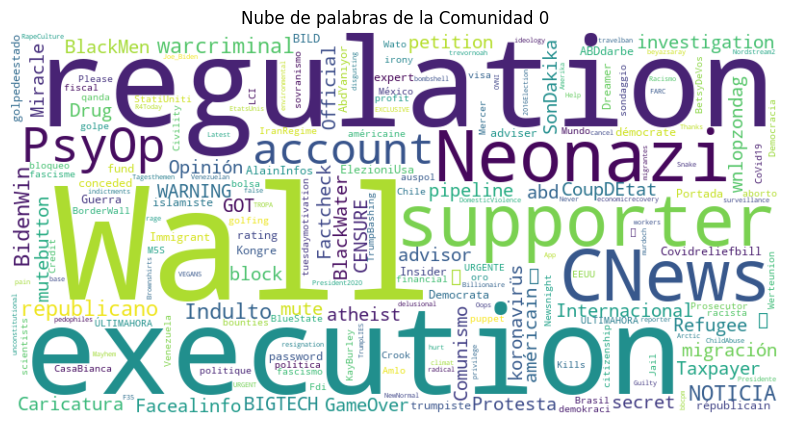

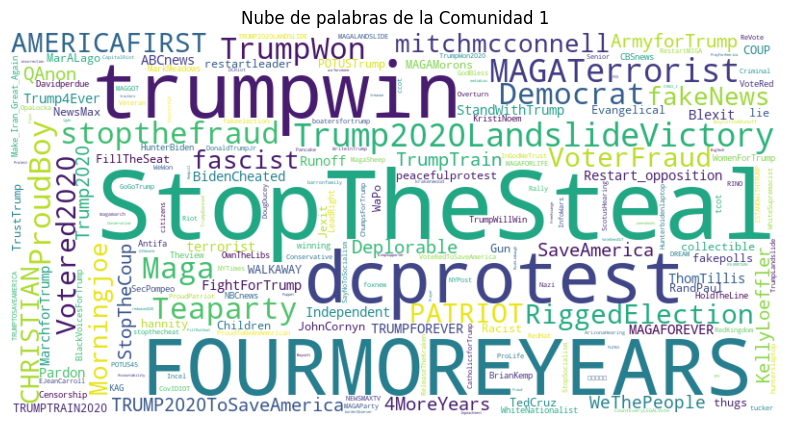

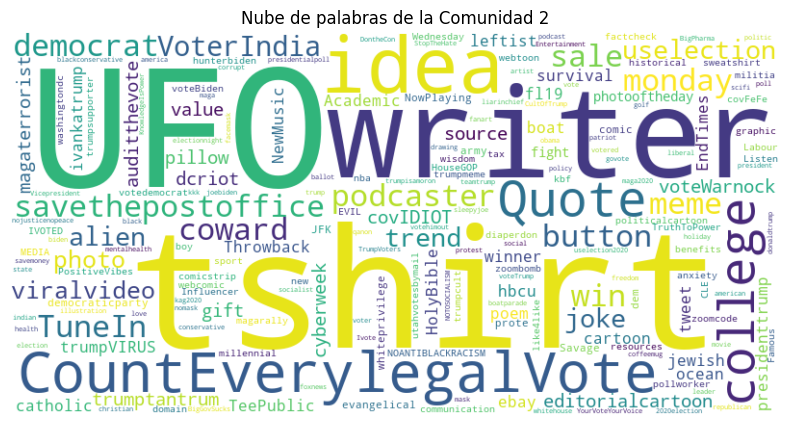

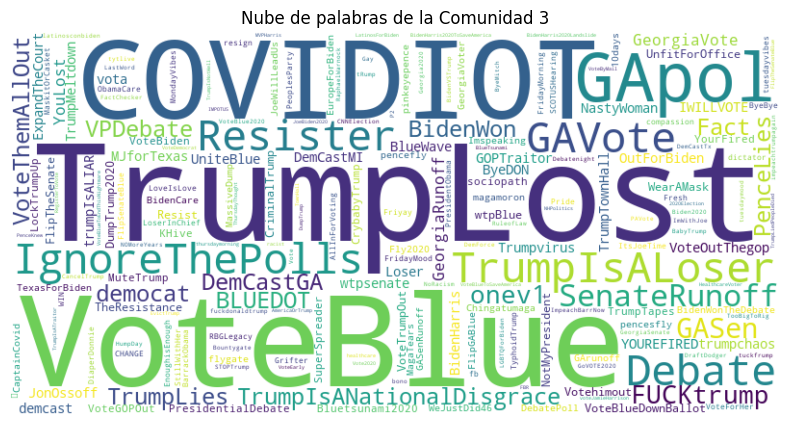

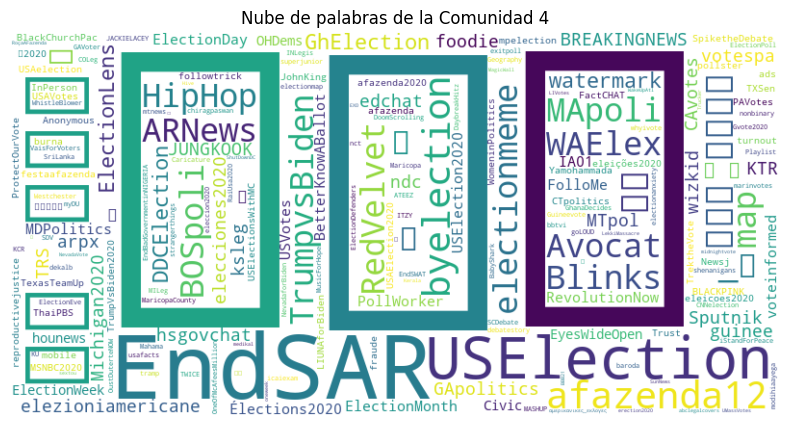

...

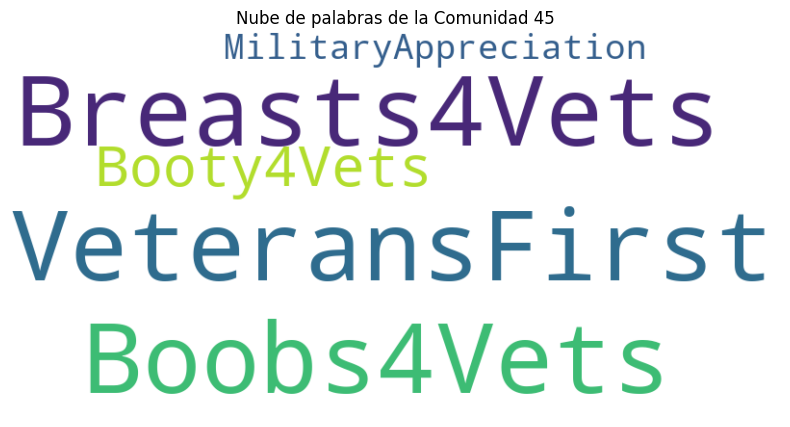

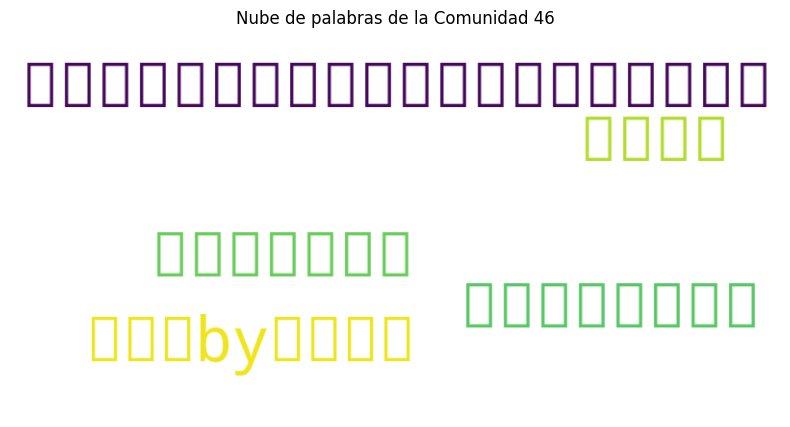

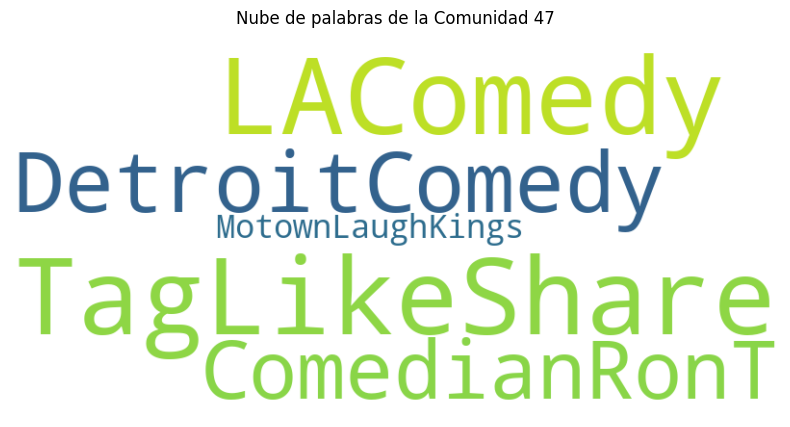

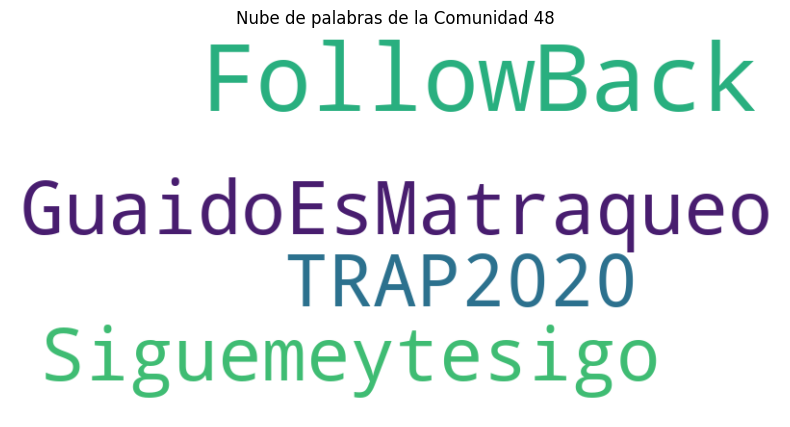

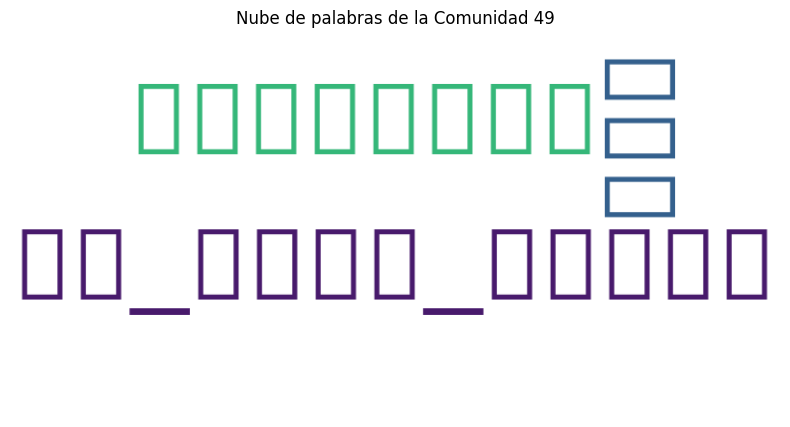

In [91]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict

#Visualizar
community_hashtags = defaultdict(list)

for node, community in coms.items():
    community_hashtags[community].append(node)  

# Crear una nube de palabras para cada comunidad
for community, hashtags in community_hashtags.items():
    # Crear un texto único con todos los hashtags para esta comunidad
    text = ' '.join(hashtags)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")  
    plt.title(f"Nube de palabras de la Comunidad {community}")
    plt.show()

